In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter

In [2]:
import pickle

In [3]:
from typing import List, Dict, Any, Tuple

In [4]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [5]:
import colorcet

In [6]:
import glob
from tqdm.notebook import tqdm
import json

In [7]:
from bertopic import BERTopic

In [8]:
# Set up LaTeX fonts
#plt.style.use(['no-latex'])
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams['text.usetex'] = True
#plt.rcParams['text.latex.unicode'] = True
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Liberation Sans', 'Bitstream Vera Sans', 'sans-serif']

In [9]:
# read embedding dict from disk
embedding_file = "data/doc_embedding_dict.pkl"

with open(embedding_file, "rb") as file:
    doc2embedding: Dict[str, Dict] = pickle.load(file)

In [10]:
embeddings: np.array = np.array(
    [
        emb for emb in doc2embedding.values()
    ]
)

In [11]:
document_indexes: List[str] = [
    emb for emb in doc2embedding.keys()
]

In [34]:
tsne = TSNE(n_components=2, perplexity=100, random_state=42, verbose=True)

tsne_embeddings = tsne.fit_transform(embeddings)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 47837 samples in 0.008s...
[t-SNE] Computed neighbors for 47837 samples in 47.096s...
[t-SNE] Computed conditional probabilities for sample 1000 / 47837
[t-SNE] Computed conditional probabilities for sample 2000 / 47837
[t-SNE] Computed conditional probabilities for sample 3000 / 47837
[t-SNE] Computed conditional probabilities for sample 4000 / 47837
[t-SNE] Computed conditional probabilities for sample 5000 / 47837
[t-SNE] Computed conditional probabilities for sample 6000 / 47837
[t-SNE] Computed conditional probabilities for sample 7000 / 47837
[t-SNE] Computed conditional probabilities for sample 8000 / 47837
[t-SNE] Computed conditional probabilities for sample 9000 / 47837
[t-SNE] Computed conditional probabilities for sample 10000 / 47837
[t-SNE] Computed conditional probabilities for sample 11000 / 47837
[t-SNE] Computed conditional probabilities for sample 12000 / 47837
[t-SNE] Computed conditional probabilities for s

In [20]:
metadata_df = pd.read_csv('data/outputs/rsc_metadata_full.csv')
metadata_df.head()

,id,issn,title,fpage,lpage,year,volume,journal,author,type,...,period,century,pages,sentences,tokens,visualizationLink,doi,jstorLink,hasAbstract,isAbstractOf
0,rspb_1978_0019,0080-4649,"The ultrastructure, development and mode of op...",245,267,1978,200,Proceedings of the Royal Society of London. Se...,"F. Gwendolen Rees, F. R. S.",article,...,1950,1900,18,516,12065,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspb.1978.0019,NaN,NaN,NaN
1,103420,02607085,"A Description of an Aurora Borealis, Seen on t...",186,190,1720,31,Philosophical Transactions (1683-1775),Samuel Cruwys,fla,...,1700,1700,5,31,1176,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rstl.1720.0046,http://www.jstor.org/stable/103420,NaN,NaN
2,rsbm_1945_0009,1479-571X,"John Jacob Fox, 1874 - 1944",141,157,1945,5,Obituary Notices of Fellows of the Royal Society,Robert Robertson|John Jacob Fox,biography,...,1900,1900,2,499,9172,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rsbm.1945.0009,NaN,NaN,NaN
3,110721,03655695,On the Production of Heat by Voltaic Electrici...,280,282,1837,4,Abstracts of the Papers Printed in the Philoso...,J. P. Joule,abs,...,1800,1800,3,20,653,http://corpora.clarin-d.uni-saarland.de/surpri...,NaN,http://www.jstor.org/stable/110721,NaN,NaN
4,rspb_1959_0017,0080-4649,Electron microscopy of collagen-like connectiv...,233,239,1959,150,Proceedings of the Royal Society of London. Se...,"E. G. Gray|J. Z. Young, F. R. S.",article,...,1950,1900,6,186,3981,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspb.1959.0017,NaN,NaN,NaN


In [14]:
# get document titles from metadata

document_titles: List[str] = []

# TODO: this is very slow, should be optimized
for doc_index in tqdm(document_indexes):
    document_titles.append(
        metadata_df.loc[
            metadata_df['id'] == doc_index
        ]['title'].values[0]
    )



  0%|          | 0/47837 [00:00<?, ?it/s]

In [41]:
document_titles_2 = [
    str(document_indexes[i]) + ' ' + title  for i, title in enumerate(document_titles)
]

In [22]:
topic_model = BERTopic(
    verbose=True,
    nr_topics=100,
    calculate_probabilities=True,
    n_gram_range=(1,2),
    #nr_topics="auto",
)

In [36]:
# Reduce outliers
topics = topic_model.reduce_outliers(document_titles, topics)
topic_model.update_topics(document_titles, topics=topics)

topic_set = set(topics)

color_set = sns.color_palette(
    colorcet.glasbey,
    n_colors=len(topic_set)
)

topic2color = {
    topic: color
    for topic, color in zip(topic_set, color_set)
}

topic2color[-1] = (0.6, 0.6, 0.6)

topic_names = topic_model.get_topic_info()['Name'].values

# topic2name = {
#     int(t_name[:t_name.find('_')]): t_name
#     for t_name in topic_names
# }

100%|██████████| 20/20 [00:02<00:00,  8.09it/s]
2024-07-24 20:44:56,676 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


In [49]:
# for d, s, t, p in zip(document_indexes, summaries, topics, probs):
#     print(f"Id: {d}")
#     print(f"Summary: {s}")
#     print(f"Topic: {t}")
#     print(f"Probabilities: {p}")

In [37]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13,-1_text_developables bicrystallography_corring...,"[text, developables bicrystallography, corring...","[An Account of a Book, An account of the petro..."
1,0,2984,0_november_society_anniversary_address,"[november, society, anniversary, address, list...","[Address of the President, Sir Charles Sherrin..."
2,1,2929,1_on_gases_on the_of,"[on, gases, on the, of, the, experiments, elec...",[On the Influence of Temperature on the Electr...
3,2,2616,2_spectrum_spectrum of_spectra_spectra of,"[spectrum, spectrum of, spectra, spectra of, a...",[Bands in the secondary spectrum of hydrogen-I...
4,3,2327,3_action_on_action of_on the,"[action, on, action of, on the, acid, of, the,...",[On the Action of Sulphuric Acid on the Nitril...
...,...,...,...,...,...
95,94,36,94_disease_cd4_glycoprotein_and disease,"[disease, cd4, glycoprotein, and disease, heal...",[The CD4 lymphocyte glycoprotein in health and...
96,95,63,95_role of_role_the role_cephalopods,"[role of, role, the role, cephalopods, of ceph...",[The role of cephalopods in the world\#x2019;s...
97,96,83,96_ion_thermodynamics_exchange_clay,"[ion, thermodynamics, exchange, clay, clay min...",[A theoretical treatment of cation exchangers ...
98,97,56,97_proteins_storage_storage proteins_seed,"[proteins, storage, storage proteins, seed, ge...",[Seed storage proteins - The physiological rol...


In [33]:
hierarchical_topics = topic_model.hierarchical_topics(document_titles)

100%|██████████| 98/98 [00:00<00:00, 168.47it/s]


In [42]:
# article_titles = [
#     doc2json[doc]["article_id"] + ': ' + doc2json[doc]["revised_title"] + '. Keyterms: ' + ', '.join(doc2json[doc]["topics"])
#     for doc in document_indexes
# ]

topic_model.visualize_documents(document_titles_2, reduced_embeddings=tsne_embeddings)

In [44]:
topic_model.get_document_info(document_titles_2)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,rspb_1977_0081 Interplexiform cells in rabbit ...,4,4_of the_the_on the_in the,"[of the, the, on the, in the, on, of, developm...",[Continuation of the Paper on the Relations be...,of the - the - on the - in the - on - of - dev...,0.212266,False
1,101101 An Account of the Dissection of a Porpe...,13,13_fossil_the structure_of the_on the,"[fossil, the structure, of the, on the, the, d...","[I. Researches on the structure, organization,...",fossil - the structure - of the - on the - the...,0.119997,False
2,rspb_1927_0005 On the mechanism of oxidation-r...,7,7_hydrogen_decomposition_reaction_kinetics,"[hydrogen, decomposition, reaction, kinetics, ...","[The thermal decomposition of acetaldehyde, Th...",hydrogen - decomposition - reaction - kinetics...,0.150213,False
3,rspb_1995_0147 Dynamic interactions in malaria...,57,57_dynamics of_dynamics_aids_and statistical,"[dynamics of, dynamics, aids, and statistical,...",[Epidemiological and statistical aspects of th...,dynamics of - dynamics - aids - and statistica...,0.151014,False
4,rstb_1953_0005 Some British Lower Palaeozoic C...,13,13_fossil_the structure_of the_on the,"[fossil, the structure, of the, on the, the, d...","[I. Researches on the structure, organization,...",fossil - the structure - of the - on the - the...,0.231611,False
...,...,...,...,...,...,...,...,...
47832,rspa_1953_0193 Diffraction of light by ultraso...,15,15_light_of light_colour_on,"[light, of light, colour, on, abstract, on the...","[Experiments on the Solar, and on the Terrestr...",light - of light - colour - on - abstract - on...,0.006284,False
47833,103606 An Account of a New Sort of Molosses Ma...,6,6_letter_mr_account_account of,"[letter, mr, account, account of, an, an accou...",[An Account of the Case of a Supposed Hydropho...,letter - mr - account - account of - an - an a...,0.080519,False
47834,109942 The Bakerian Lecture. On the Compositio...,3,3_action_on_action of_on the,"[action, on, action of, on the, acid, of, the,...",[On the Action of Sulphuric Acid on the Nitril...,action - on - action of - on the - acid - of -...,0.118250,False
47835,rspa_1953_0050 Electronic wave functions IX. C...,11,11_theory_theory of_field_quantum,"[theory, theory of, field, quantum, relativity...",[Some spherical gravitational waves in general...,theory - theory of - field - quantum - relativ...,0.141535,False


In [54]:
#topic_model.visualize_heatmap(n_clusters=29)

In [55]:
#print(topic_model.get_topic_tree(hierarchical_topics))

In [45]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [46]:
topic_model.visualize_barchart(top_n_topics=79, n_words=10)

In [48]:
#topic2label

In [30]:
topic2label = {
    int(t_lable.split()[0]): ', '.join(t_lable.split()[0:])
    for t_lable in topic_model.generate_topic_labels(
        nr_words=20, 
        separator=" "
    )
}

topic2label

{0: '0, astronomy, celestial, celestial, mechanics, astronomical, telescopes, eclipse, mechanics, observations, solar, observational',
 1: '1, magnetic, magnetism, magnetism, magnetic, declination, magnetic, observations, magnetic, declination, iron, magnetic, properties, terrestrial, terrestrial, magnetism',
 2: '2, electrical, electricity, electromagnetic, discharge, electric, electrostatics, electromagnetism, induction, conductivity, force',
 3: '3, fish, marine, biology, marine, biology, fish, anatomy, anatomy, zoology, development, ichthyology, reproduction',
 4: '4, chemistry, compounds, organic, chemical, organic, chemistry, reactions, acid, chemical, reactions, inorganic, inorganic, chemistry',
 5: '5, heat, thermal, heat, transfer, transfer, thermodynamics, radiation, thermal, conductivity, molecular, specific, heat, gas',
 6: '6, geology, mineralogy, volcanology, water, mining, mineral, salt, springs, volcanology, geology, geochemistry',
 7: '7, plant, botany, plant, anatomy,

In [31]:
def get_category_centroids(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str]           # list of categories
    ) -> Dict[str, np.array]:    # return dict of category centroids

    cateogry_embeddings = defaultdict(list)

    for cat, tsne_emb in zip(category_list, embeddings_2D):
        cateogry_embeddings[cat].append(tsne_emb)

    category_centroids = {}

    for cat, embeddings in cateogry_embeddings.items():
        centroid = np.median(embeddings, axis=0)
        category_centroids[cat] = centroid

    return category_centroids

In [32]:
def plot_embedding_2D(
        embeddings_2D: np.array, # 2D tsne embeddings
        category_list: List[str],          # list of categories 
        with_captions: bool = True         # show category captions  
    ) -> None:                             # show plot, return None  


    colors: Dict[str, str] = [
        topic2color[cat] for cat in category_list
    ]
    
    # Create a scatter plot to visualize the t-SNE embeddings
    plt.figure(figsize=(12, 12))

    scatter = plt.scatter(
        embeddings_2D[:, 0], 
        embeddings_2D[:, 1], 
        alpha=0.25, 
        c=colors,
        marker='o',
        s=18
    )

    category_centroids = get_category_centroids(
        embeddings_2D, 
        category_list
    )


    handles = [
        plt.Line2D(
            [],
            [],
            marker='o',
            color=topic2color[cat], 
            linestyle='', 
            markersize=8,
            label=topic2label[cat]
        ) for cat in sorted(list(category_centroids.keys())) 
        if cat != 'Other'
    ]

    if with_captions:

        for cat, centroid in category_centroids.items():

            if cat == "Other":
                continue

            #rand_int = random.randint(-5, 5)

            plt.text(
                centroid[0], #- 15, 
                centroid[1], #- rand_int, 
                cat, #r"${{{}}}$".format(category2text[cat]), 
                fontdict=dict(fontsize=24, fontweight='normal', color='black'), 
                bbox=dict(
                    facecolor=topic2color[cat], 
                    alpha=0.5, 
                    linewidth=0, 
                    boxstyle='round,pad=0.1'
                    )
                )

    plt.legend(
        handles=handles, 
        title="", 
        fontsize=18, 
        framealpha=0,
        #loc='lower center',
        loc='upper left', 
        #bbox_to_anchor=(0.5, -0.25), 
        bbox_to_anchor=(1, 1), 
        #ncols=3,
        ncols=1,
    )


    plt.title('t-SNE projections', fontsize=16)
    #plt.xlabel('t-SNE Dimension 1')
    #plt.ylabel('t-SNE Dimension 2')
    #plt.ylim(-100, 100)
    #plt.xlim(-110, 110)

    plt.show()    

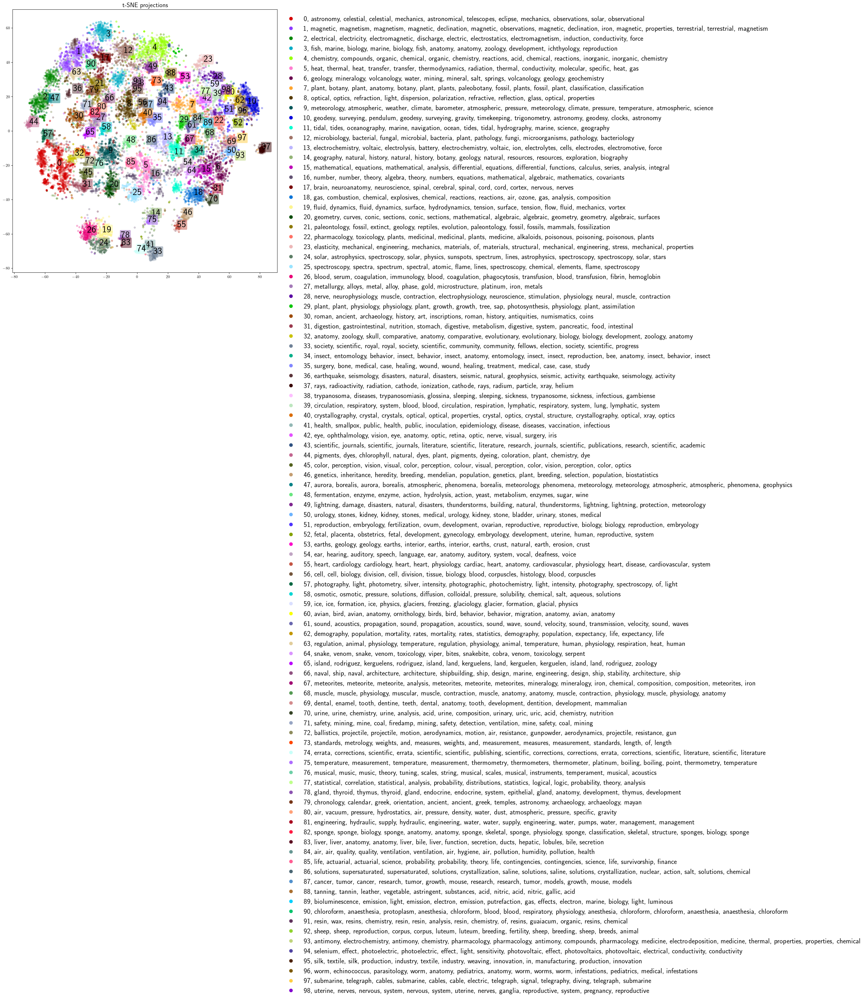

In [59]:
plot_embedding_2D(tsne_embeddings, topics, with_captions=True)

In [53]:

# read the metadat file into a pandas dataframe
metadata_file = '../data/Royal_Society_Corpus_open_v6.0_meta.tsv'

metadata_df = pd.read_csv(metadata_file, delimiter='\t')

metadata_df.head()

,id,issn,title,fpage,lpage,year,volume,journal,author,type,...,tokens,visualizationLink,doi,jstorLink,hasAbstract,isAbstractOf,primaryTopic,primaryTopicPercentage,secondaryTopic,secondaryTopicPercentage
0,rspa_1905_0001,0950-1207,"Address delivered by the President, Sir Willia...",1,29,1905,76,Proceedings of the Royal Society of London. Se...,"Sir William Huggins K. C. B., O. M., F. R. S.",speech,...,14279,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0001,NaN,NaN,NaN,Biography,87.018807,Immunology,3.397728
1,rspa_1905_0002,0950-1207,"The boring of the Simplon Tunnel, and the dist...",29,33,1905,76,Proceedings of the Royal Society of London. Se...,"Francis Fox, M. Inst. C. E. |C. V. Boys, F. R. S.",article,...,1816,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0002,NaN,NaN,NaN,Geography,34.843817,Thermodynamics,26.224835
2,rspa_1905_0003,0950-1207,On a method of finding the conductivity for heat.,34,48,1905,76,Proceedings of the Royal Society of London. Se...,"Professor C. Niven, F. R. S.",article,...,3624,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0003,NaN,NaN,NaN,Electricity,22.229782,Formulae,19.054271
3,rspa_1905_0004,0950-1207,Theory of the reflection of light near the pol...,49,65,1905,76,Proceedings of the Royal Society of London. Se...,"Richard C. Maclaurin, M. A., LL. D.|Professor ...",article,...,2722,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0004,NaN,NaN,NaN,Tables,38.543461,Fluid Dynamics,28.361855
4,rspa_1905_0005,0950-1207,On the relation between variations of atmosphe...,66,86,1905,76,Proceedings of the Royal Society of London. Se...,"Captain H. G. Lyons|Sir W. E. Garstin, G. C. M...",article,...,10079,http://corpora.clarin-d.uni-saarland.de/surpri...,10.1098/rspa.1905.0005,NaN,NaN,NaN,Meteorology,51.203697,Geography,22.031809


In [59]:
# add year, decade, and period to the dictionaries in doc2json

for doc in tqdm(doc2json):
    df_row = metadata_df.loc[metadata_df['id'] == doc]
    year = df_row['year'].values[0]
    decade = df_row['decade'].values[0]
    period = df_row['period'].values[0]

    doc2json[doc]['year'] = year
    doc2json[doc]['decade'] = decade
    doc2json[doc]['period'] = period

  0%|          | 0/17486 [00:00<?, ?it/s]

100%|██████████| 17486/17486 [00:13<00:00, 1287.74it/s]


In [67]:
decades = [
    doc2json[doc]['decade'] for doc in document_indexes
]

In [68]:

topics_over_time = topic_model.topics_over_time(topic_sentences, decades)

topic_model.visualize_topics_over_time(topics_over_time, topics=[15, 40, 42, 62])

0it [00:00, ?it/s]

27it [00:01, 19.97it/s]
